<a href="https://colab.research.google.com/github/vrnTEK/Deep-Learning/blob/master/Social_Media_Caption_new.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Title:** 

    Image Captioning using Attention Mechanism

**Author(s):** 

    Poornapragna Vadiraj,

    Varun Bhaseen,

    Mirsaeid Abolghasemi

#  Image Captioning - CNN encoding-->Attention-->LSTM decoding

## Loading Images and Extracting Features
Features extracted is the base of our model from a pretrained CNN (on imageNet). A pretrained VGG16 network is used to loads the images and then extract features.
A vector of 4096 features for each image will be produced.
At the end, for future to use the features of all images, we saved them to a file.


In [0]:
# DO THIS ONLY ONCE
# This downloads the dataset to directory we specify
# !apt-get install transmission-cli

# !transmission-cli -w '/content/drive/My Drive/SocialMediaCaptionData' http://academictorrents.com/download/9dea07ba660a722ae1008c4c8afdd303b6f6e53b.torrent


Reading package lists... Done
Building dependency tree       
Reading state information... Done
transmission-cli is already the newest version (2.92-3ubuntu2).
0 upgraded, 0 newly installed, 0 to remove and 31 not upgraded.
transmission-cli 2.92 (14714)
[2020-05-18 23:27:14.243] Transmission 2.92 (14714) started
[2020-05-18 23:27:14.244] RPC Server: Adding address to whitelist: 127.0.0.1
[2020-05-18 23:27:14.244] UDP: Failed to set receive buffer: requested 4194304, got 425984
[2020-05-18 23:27:14.244] UDP: Please add the line "net.core.rmem_max = 4194304" to /etc/sysctl.conf
[2020-05-18 23:27:14.244] UDP: Failed to set send buffer: requested 1048576, got 425984
[2020-05-18 23:27:14.244] UDP: Please add the line "net.core.wmem_max = 1048576" to /etc/sysctl.conf
[2020-05-18 23:27:14.244] DHT: Generating new id
[2020-05-18 23:27:14.576] Port Forwarding (NAT-PMP): initnatpmp succeeded (0)
[2020-05-18 23:27:14.576] Port Forwarding (NAT-PMP): sendpublicaddressrequest succeeded (2)
[2020-05-

In [0]:
#Navigate to our dataset
# cd /content/drive/My Drive/SocialMediaCaptionData/Flickr8k

/content/drive/My Drive/SocialMediaCaptionData/Flickr8k


In [0]:
!unzip Flickr8k_Dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Flicker8k_Dataset/3429142249_d09a32e291.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3429142249_d09a32e291.jpg  
  inflating: Flicker8k_Dataset/3429194423_98e911a101.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3429194423_98e911a101.jpg  
  inflating: Flicker8k_Dataset/3429351222_17ae744daf.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3429351222_17ae744daf.jpg  
  inflating: Flicker8k_Dataset/3429351964_531de1bf16.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3429351964_531de1bf16.jpg  
  inflating: Flicker8k_Dataset/3429391520_930b153f94.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3429391520_930b153f94.jpg  
  inflating: Flicker8k_Dataset/3429465163_fb8ac7ce7f.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3429465163_fb8ac7ce7f.jpg  
  inflating: Flicker8k_Dataset/3429581486_4556471d1a.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3429581486_4556471d1a.jpg  
  inflating: Flicker8k_Dataset/3429641260_2f03

In [0]:
# Make sure we have 8k files
ls | wc -l

8091


In [0]:
!cd ..
# !ls
#!unzip Flickr8k_text.zip

In [0]:
!cd "/content/drive/My Drive/SocialMediaCaptionData/Flickr8k"
# !ls
# !ls
# !cat readme.txt

Flickr8k


In [0]:
!rm *.zip
!cd ""

## Mounting Google Drive locally

In [0]:
from google.colab import drive
drive.mount('/content/drive')

In [0]:
cd "/content/drive/My Drive/SocialMediaCaptionData/Flickr8k"

/content/drive/My Drive/SocialMediaCaptionData/Flickr8k


In [0]:
# Full disclosure and credits to the dataset 
cat readme.txt

If you use this corpus / data:

Please cite: M. Hodosh, P. Young and J. Hockenmaier (2013) "Framing Image Description as a Ranking Task: Data, Models and Evaluation Metrics", Journal of Artifical Intellegence Research, Volume 47, pages 853-899
http://www.jair.org/papers/paper3994.html


Captions, Dataset Splits, and Human Annotations :


Flickr8k.token.txt - the raw captions of the Flickr8k Dataset . The first column is the ID of the caption which is "image address # caption number"

Flickr8k.lemma.txt - the lemmatized version of the above captions 

Flickr_8k.trainImages.txt - The training images used in our experiments
Flickr_8k.devImages.txt - The development/validation images used in our experiments
Flickr_8k.testImages.txt - The test images used in our experiments


ExpertAnnotations.txt is the expert judgments.  The first two columns are the image and caption IDs.  Caption IDs are <image file name>#<0-4>.  The next three columns are the expert judgments for that image-caption pai

## Statement of Pupose
Picture captioning is an fascinating topic, where we will study the strategies of computer vision and the interpretation of natural language. We followed Show, Attend and Tell for Neural Image Caption Generation with Visual Awareness in case study and build a model for generating image captions using Flicker 8K dataset. This model takes as input captions and images associated with it, output the caption to a picture, and learning the caption that similar images were trained on.

## How we approached the project
After much deliberation, we decided to focus more on the model.


## Data
To address this problem, there are many open source datasets available, such as Flickr 8k (containing 8k images), Flickr 30k (containing 30k images), MS COCO (containing 180k images), etc. But we have used the Flickr 8k dataset for this case study which you can access from here. Training a model with a large number of images on a system that is not a very high end PC / Laptop may not be feasible either. This dataset contains 8000 images with 5 captions each (as we already saw in the Introduction section that an image can have multiple captions, all of which are relevant at the same time). These images are bifurcated as follows: Training Set — 6000 images, Dev Set — 1000 images, and Test Set — 1000 images.

### Dataset Reference:

- http://academictorrents.com/details/9dea07ba660a722ae1008c4c8afdd303b6f6e53b

__Flickr8k_Dataset:__ Contains all the images 

__Flickr8k_text:__ Contains all the captions

In [0]:
#Example
# n-gram individual BLEU
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import corpus_bleu

reference = [['this', 'a', 'test','of', 'cricket', 'match']]
candidate = ['this', 'is', 'a', 'test','of', 'cricket', 'match']
# print("The cumulative and individual 1-gram BLEU use the same weights, e.g. (1, 0, 0, 0)")
# print('Sentence Bleu 1-gram: %f' % sentence_bleu(reference, candidate, weights=(1, 0, 0, 0)))
# print('Corpus Bleu 1-gram: %f' % corpus_bleu([reference], [candidate], weights=(1, 0, 0, 0)))
# print("\n")

# print("The cumulative and individual 2-gram BLEU use the same weights, e.g. (0, 1, 0, 0)")
# print('Sentence Bleu 2-gram: %f' % sentence_bleu(reference, candidate, weights=(0, 1, 0, 0)))
# print('Corpus Bleu 2-gram: %f' % corpus_bleu([reference], [candidate], weights=(0, 1, 0, 0)))
# print("\n")

# print("The cumulative and individual 3-gram BLEU use the same weights, e.g. (0, 0, 1, 0)")
# print('Sentence Bleu 3-gram: %f' % sentence_bleu(reference, candidate, weights=(0, 0, 1, 0)))
# print('Corpus Bleu 3-gram: %f' % corpus_bleu([reference], [candidate], weights=(0, 0, 1, 0)))
# print("\n")

# print("The cumulative and individual 4-gram BLEU use the same weights, e.g. (0, 0, 0, 1)")
# print('Sentence Bleu 4-gram: %f' % sentence_bleu(reference, candidate, weights=(0, 0, 0, 1)))
# print('Corpus Bleu 4-gram: %f' % corpus_bleu([reference], [candidate], weights=(0, 0, 0, 1)))
# print("\n")

# print("The 2-gram weights assign a 50% to each of 1-gram and 2-gram")
# print('Corpus Bleu 1-gram: %f' % corpus_bleu([reference], [candidate], weights=(0.5, 0.5, 0, 0)))
# print("\n")

# print("3-gram weights are 33% for each of the 1, 2 and 3-gram scores")
# print('Corpus Bleu 1-gram: %f' % corpus_bleu([reference], [candidate], weights=(0.33, 0.33, 0.33, 0)))
# print("\n")

# print("4-gram weights are 25% for each of the 1, 2 3 and 4-gram scores")
# print('Corpus Bleu 1-gram: %f' % corpus_bleu([reference], [candidate], weights=(0.25, 0.25, 0.25, 0.25)))

# Loading all the dependencies

In [0]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

print(tf.__version__)

2.2.0


In [0]:
import string
from numpy import array
from pickle import load
from tensorflow.keras.preprocessing.text import Tokenizer
import matplotlib.pyplot as plt
# from tensorflow.keras.backend.tensorflow_backend import set_session
import pathlib

# import keras
import sys, time, os, warnings 
warnings.filterwarnings("ignore")
import re

import numpy as np
import pandas as pd 
from PIL import Image
import pickle
from collections import Counter
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense, BatchNormalization
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import add
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.utils import shuffle
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

THIS_FOLDER = os.path.dirname(os.path.abspath(__file__))  
        try:  
            os.remove(os.path.join(THIS_FOLDER,'static','css','temp5.jpg'))  
        except:  
            print("No file")  

# Loading and then cleaning the dataset

In [0]:
# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

# To remove punctuations
def remove_punctuation(text_original):
    text_no_punctuation = text_original.translate(string.punctuation)
    return(text_no_punctuation)


# To remove single characters
def remove_single_character(text):
    text_len_more_than1 = ""
    for word in text.split():
        if len(word) > 1:
            text_len_more_than1 += " " + word
    return(text_len_more_than1)

# To remove numeric values
def remove_numeric(text,printTF=False):
    text_no_numeric = ""
    for word in text.split():
        isalpha = word.isalpha()
        if printTF:
            print("    {:10} : {:}".format(word,isalpha))
        if isalpha:
            text_no_numeric += " " + word
    return(text_no_numeric)

# Analyzing the Dataset 

In [0]:
cd "/content/drive/My Drive/SocialMediaCaptionData"

/content/drive/My Drive/SocialMediaCaptionData


In [0]:
from os import listdir
## The location of the Flickr8K_ photos

image_dir = pathlib.Path('./Flickr8k/Flicker8k_Dataset/.')
images = listdir(image_dir)

## The location of the caption file
descriptions_dir = pathlib.Path('./Flickr8k/Flickr8k.token.txt')

print("The number of jpg flies in Flicker8k: {}".format(len(images)))

The number of jpg flies in Flicker8k: 8091


In [0]:
## read in the Flickr caption data
text = load_doc(descriptions_dir)
print(text[:325])

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg#3	A little girl climbing the stairs to her playhouse .



# Creating a dataframe 


In [0]:
def make_dataset(text):
  df = []
  for sentences in text.split('\n'):
      splitted = sentences.split('\t')
      if len(splitted) == 1:
          continue
      w = splitted[0].split("#")
      df.append(w + [splitted[1].lower()])
  return df

In [0]:
df = make_dataset(text)

In [0]:
df[:10]

[['1000268201_693b08cb0e.jpg',
  '0',
  'a child in a pink dress is climbing up a set of stairs in an entry way .'],
 ['1000268201_693b08cb0e.jpg', '1', 'a girl going into a wooden building .'],
 ['1000268201_693b08cb0e.jpg',
  '2',
  'a little girl climbing into a wooden playhouse .'],
 ['1000268201_693b08cb0e.jpg',
  '3',
  'a little girl climbing the stairs to her playhouse .'],
 ['1000268201_693b08cb0e.jpg',
  '4',
  'a little girl in a pink dress going into a wooden cabin .'],
 ['1001773457_577c3a7d70.jpg',
  '0',
  'a black dog and a spotted dog are fighting'],
 ['1001773457_577c3a7d70.jpg',
  '1',
  'a black dog and a tri-colored dog playing with each other on the road .'],
 ['1001773457_577c3a7d70.jpg',
  '2',
  'a black dog and a white dog with brown spots are staring at each other in the street .'],
 ['1001773457_577c3a7d70.jpg',
  '3',
  'two dogs of different breeds looking at each other on the road .'],
 ['1001773457_577c3a7d70.jpg',
  '4',
  'two dogs on pavement moving t

In [0]:
data = pd.DataFrame(df,columns=["filename","index","caption"])
# Reordering columns for better readability
data = data.reindex(columns =['index','filename','caption'])

In [0]:
data

,index,filename,caption
0,0,1000268201_693b08cb0e.jpg,a child in a pink dress is climbing up a set o...
1,1,1000268201_693b08cb0e.jpg,a girl going into a wooden building .
2,2,1000268201_693b08cb0e.jpg,a little girl climbing into a wooden playhouse .
3,3,1000268201_693b08cb0e.jpg,a little girl climbing the stairs to her playh...
4,4,1000268201_693b08cb0e.jpg,a little girl in a pink dress going into a woo...
...,...,...,...
40455,0,997722733_0cb5439472.jpg,a man in a pink shirt climbs a rock face
40456,1,997722733_0cb5439472.jpg,a man is rock climbing high in the air .
40457,2,997722733_0cb5439472.jpg,a person in a red shirt climbing up a rock fac...
40458,3,997722733_0cb5439472.jpg,a rock climber in a red shirt .


# Cleaning Data:

In [0]:
# If any filename dosn't have .jpg extension at last then mark it as Invalid filename
def invalid_filename_check(data):
  for filenames in data["filename"]:
    found = re.search("(.(jpg)$)", filenames)
    if (found):
        pass
    else:
        print("Error file: {}".format(filenames))

In [0]:
invalid_filename_check(data)

Error file: 2258277193_586949ec62.jpg.1
Error file: 2258277193_586949ec62.jpg.1
Error file: 2258277193_586949ec62.jpg.1
Error file: 2258277193_586949ec62.jpg.1
Error file: 2258277193_586949ec62.jpg.1


- We must remove this error file from out dataset

In [0]:
data[data['filename'] == "2258277193_586949ec62.jpg.1"]

,index,filename,caption
6730,0,2258277193_586949ec62.jpg.1,people waiting for the subway
6731,1,2258277193_586949ec62.jpg.1,some people looking out windows in a large bui...
6732,2,2258277193_586949ec62.jpg.1,three people are waiting on a train platform .
6733,3,2258277193_586949ec62.jpg.1,three people standing at a station .
6734,4,2258277193_586949ec62.jpg.1,two woman and one man standing near train trac...


In [0]:
data = data[data['filename'] != '2258277193_586949ec62.jpg.1']
data.shape

(40455, 3)

In [0]:
def utility_counter(data):

  unique_filenames = np.unique(data.filename.values)
  print("The number of unique file names : {}".format(len(unique_filenames)))

  ct_dict = Counter(data.filename.values)
  print("We can see that all the keys are having values count = 5")
  print(ct_dict)

  print("The distribution of the number of captions for each image:")
  ct = Counter(Counter(data.filename.values).values())
  print(ct)
  return unique_filenames

In [0]:
unique_filenames = utility_counter(data)

The number of unique file names : 8091
We can see that all the keys are having values count = 5
Counter({'1000268201_693b08cb0e.jpg': 5, '1001773457_577c3a7d70.jpg': 5, '1002674143_1b742ab4b8.jpg': 5, '1003163366_44323f5815.jpg': 5, '1007129816_e794419615.jpg': 5, '1007320043_627395c3d8.jpg': 5, '1009434119_febe49276a.jpg': 5, '1012212859_01547e3f17.jpg': 5, '1015118661_980735411b.jpg': 5, '1015584366_dfcec3c85a.jpg': 5, '101654506_8eb26cfb60.jpg': 5, '101669240_b2d3e7f17b.jpg': 5, '1016887272_03199f49c4.jpg': 5, '1019077836_6fc9b15408.jpg': 5, '1019604187_d087bf9a5f.jpg': 5, '1020651753_06077ec457.jpg': 5, '1022454332_6af2c1449a.jpg': 5, '1022454428_b6b660a67b.jpg': 5, '1022975728_75515238d8.jpg': 5, '102351840_323e3de834.jpg': 5, '1024138940_f1fefbdce1.jpg': 5, '102455176_5f8ead62d5.jpg': 5, '1026685415_0431cbf574.jpg': 5, '1028205764_7e8df9a2ea.jpg': 5, '1030985833_b0902ea560.jpg': 5, '103106960_e8a41d64f8.jpg': 5, '103195344_5d2dc613a3.jpg': 5, '103205630_682ca7285b.jpg': 5, '10321

In [0]:
def image_desc_plotter(data):
  npic = 5
  npix = 224
  target_size = (npix,npix,3)

  count = 1
  fig = plt.figure(figsize=(10,20))
  for jpgfnm in unique_filenames[20:25]:
      filename = str(image_dir) + '/' + jpgfnm
      captions = list(data["caption"].loc[data["filename"]==jpgfnm].values)
      image_load = load_img(filename, target_size=target_size)
      
      ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
      ax.imshow(image_load)
      count += 1
      
      ax = fig.add_subplot(npic,2,count)
      plt.axis('off')
      ax.plot()
      ax.set_xlim(0,1)
      ax.set_ylim(0,len(captions))
      for i, caption in enumerate(captions):
          ax.text(0,i,caption,fontsize=20)
      count += 1
  plt.show()

#  Data Preprocessing




In [0]:
def create_vocabulary(data):
  vocab = []
  for captions in data.caption.values:
    vocab.extend(captions.split())
  print("Vocabulary Size : {}".format(len(set(vocab))))
  return vocab

In [0]:
vocabulary = create_vocabulary(data)

Vocabulary Size : 8918


In [0]:
def df_word_count(data,vocabulary):
    ct = Counter(vocabulary)
    appen_1 = []
    appen_2 = []
    for i in ct.keys():
        appen_1.append(i)
    for j in ct.values():
        appen_2.append(j)
    data = {"word":appen_1 , "count":appen_2}
    dfword = pd.DataFrame(data)
    dfword = dfword.sort_values(by='count', ascending=False)
    dfword = dfword.reset_index()[["word","count"]]
    return(dfword)

In [0]:
dfwordcount = df_word_count(data,vocabulary)

In [0]:
dfwordcount.iloc[:10,:]

,word,count
0,a,62986
1,.,36577
2,in,18974
3,the,18418
4,on,10743
5,is,9345
6,and,8851
7,dog,8136
8,with,7765
9,man,7265


## Showing the top 50 most and least frequently appearing words


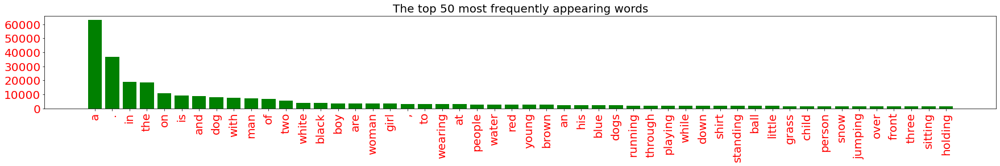

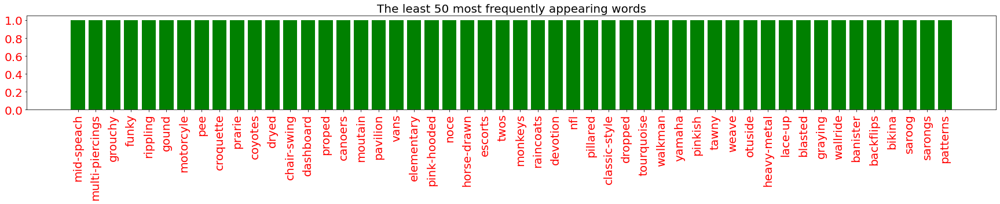

In [0]:
topn = 50

def plthist(dfsub, title="The top 50 most frequently appearing words"):
    plt.figure(figsize=(30,3))
    plt.bar(dfsub.index,dfsub["count"],color ='g')
    plt.yticks(fontsize=20,color ='r')
    plt.xticks(dfsub.index,dfsub["word"],rotation=90,fontsize=20,color ='r')
    plt.title(title,fontsize=20)
    plt.show()

plthist(dfwordcount.iloc[:topn,:],
        title="The top 50 most frequently appearing words")
plthist(dfwordcount.iloc[-topn:,:],
        title="The least 50 most frequently appearing words")

## Captions Cleaning 


In [0]:
def text_clean(text_original):
    text = remove_punctuation(text_original)
    text = remove_single_character(text)
    text = remove_numeric(text)
    return(text)
    
for i, caption in enumerate(data.caption.values):
    newcaption = text_clean(caption)
    data["caption"].iloc[i] = newcaption

In [0]:
clean_vocabulary = create_vocabulary(data)

Vocabulary Size : 8357


In [0]:
dfwordcount = df_word_count(data,clean_vocabulary)
# plthist(dfwordcount.iloc[:topn,:],
#         title="The top 50 most frequently appearing words")
# plthist(dfwordcount.iloc[-topn:,:],
#         title="The least 50 most frequently appearing words")

## Image Pre-Processing


In [0]:
def preprocess_images(data):
  all_img_name_vector = []

  for filenames in data["filename"]:
      full_image_path = str(image_dir) +"/"+ filenames
      all_img_name_vector.append(full_image_path)
  return all_img_name_vector
all_img_name_vector = preprocess_images(data)
all_img_name_vector[:10]

['Flickr8k/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 'Flickr8k/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 'Flickr8k/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 'Flickr8k/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 'Flickr8k/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 'Flickr8k/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 'Flickr8k/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 'Flickr8k/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 'Flickr8k/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 'Flickr8k/Flicker8k_Dataset/1001773457_577c3a7d70.jpg']

## Adding '< start >' and '< end >' tags to every caption to make it understandable for ML model understands.

In [0]:
def preprocess_captions(data):
  total_captions = []

  for caption  in data["caption"].astype(str):
      caption = '<start> ' + caption+ ' <end>'
      total_captions.append(caption)
  return total_captions
total_captions = preprocess_captions(data)
total_captions[:10]

['<start>  child in pink dress is climbing up set of stairs in an entry way <end>',
 '<start>  girl going into wooden building <end>',
 '<start>  little girl climbing into wooden playhouse <end>',
 '<start>  little girl climbing the stairs to her playhouse <end>',
 '<start>  little girl in pink dress going into wooden cabin <end>',
 '<start>  black dog and spotted dog are fighting <end>',
 '<start>  black dog and dog playing with each other on the road <end>',
 '<start>  black dog and white dog with brown spots are staring at each other in the street <end>',
 '<start>  two dogs of different breeds looking at each other on the road <end>',
 '<start>  two dogs on pavement moving toward each other <end>']

In [0]:
ten_images = all_img_name_vector[:50] # Each image repeats 5 times in dataset
unique_images = np.unique(ten_images)
print(unique_images)

['Flickr8k/Flicker8k_Dataset/1000268201_693b08cb0e.jpg'
 'Flickr8k/Flicker8k_Dataset/1001773457_577c3a7d70.jpg'
 'Flickr8k/Flicker8k_Dataset/1002674143_1b742ab4b8.jpg'
 'Flickr8k/Flicker8k_Dataset/1003163366_44323f5815.jpg'
 'Flickr8k/Flicker8k_Dataset/1007129816_e794419615.jpg'
 'Flickr8k/Flicker8k_Dataset/1007320043_627395c3d8.jpg'
 'Flickr8k/Flicker8k_Dataset/1009434119_febe49276a.jpg'
 'Flickr8k/Flicker8k_Dataset/1012212859_01547e3f17.jpg'
 'Flickr8k/Flicker8k_Dataset/1015118661_980735411b.jpg'
 'Flickr8k/Flicker8k_Dataset/1015584366_dfcec3c85a.jpg']


In [0]:
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread

def showImagesHorizontally(ten_images):
    fig = figure()
    number_of_files = len(ten_images)
    for i in range(number_of_files):
        a=fig.add_subplot(1,number_of_files,i+1)
        image = imread(ten_images[i])
        imshow(image,cmap='Greys_r', aspect='equal', interpolation='nearest')
        axis('off')

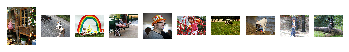

In [0]:
showImagesHorizontally(unique_images)

In [0]:
print("Total Images : " + str(len(all_img_name_vector)))
print("Total Captions : " + str(len(total_captions)))

Total Images : 40455
Total Captions : 40455


In [0]:
def data_limiter(num,total_captions,all_img_name_vector):
  # Shuffle captions and image_names together
  train_captions, img_name_vector = shuffle(total_captions,all_img_name_vector,random_state=1)
  train_captions = train_captions[:num]
  img_name_vector = img_name_vector[:num]
  return train_captions,img_name_vector


******************************************************************************
---
##Important Cell. It selects the number of images and caption size for training

*******************************************************************************
---



---




In [0]:
train_captions,img_name_vector = data_limiter(40000,total_captions,all_img_name_vector)

In [0]:
print("Total Captions = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))

Total Captions = 40000 , Total images = 40000


## Restoring variables by saving them in a pickle file

In [0]:
from pickle import dump

# save to file
dump(train_captions, open('captions.pkl', 'wb'))
dump(img_name_vector, open('img_names.pkl', 'wb'))

In [0]:
train_captions = load(open('captions.pkl', 'rb'))
img_name_vector = load(open('img_names.pkl', 'rb'))

In [0]:
print("Total Captions = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))

Total Captions = 40000 , Total images = 40000


In [0]:
# To know the shape of images
def img_shape_finder(image):
  img= plt.imread(image)

  print("Shape of the image ==> {0} is ==> {1}".format(image.split('/')[1],img.shape))

In [0]:
img_list=[]
for i in range(20):
  img_list.append(img_name_vector[i])

In [0]:
for j in img_list:
  img_shape_finder(j)

Shape of the image ==> Flicker8k_Dataset is ==> (500, 375, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (375, 500, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (375, 500, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (400, 500, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (274, 500, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (375, 500, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (334, 500, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (500, 354, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (500, 333, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (350, 500, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (375, 500, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (375, 500, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (322, 500, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (375, 500, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (500, 333, 3)
Shape of the image ==> Flicker8k_Dataset is ==> (333, 500, 3)
Shape of

Shape of the image:(333, 500, 3)


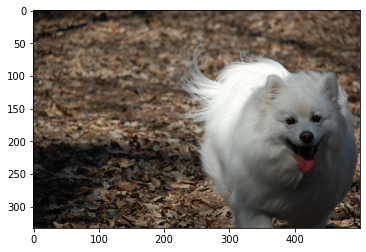

In [0]:
# To know the shape of images
def image_and_shapes(image):
  img= plt.imread(image)
  plt.imshow(img)
  print("Shape of the image:{}".format(img.shape))

image_and_shapes("./Flickr8k//Flicker8k_Dataset/3439243433_d5f3508612.jpg")

## Image Augmentation:

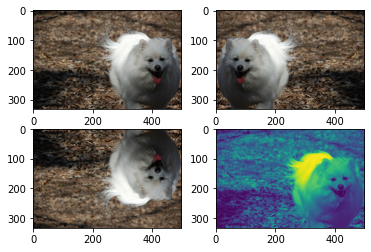

In [0]:
import imageio
def image_flipper(image):
  original_img = imageio.imread(image)
  
  plt.figure(1)

#Original Image

  plt.subplot(221)
  plt.imshow(original_img)

#Left-Right flip Image

  flipped_img_tensor = tf.image.flip_left_right(original_img)
  flipped_img= flipped_img_tensor.numpy()
  plt.subplot(222)
  plt.imshow(flipped_img)

#Up-Down flip Image

  upside_down_flip_tensor = tf.image.flip_up_down(original_img)
  upside_down_flip= upside_down_flip_tensor.numpy()
  plt.subplot(223)
  plt.imshow(upside_down_flip)

#Gray scale Image

  gray_tensor = tf.image.rgb_to_grayscale(original_img)
  grayimg= gray_tensor.numpy()
  plt.subplot(224)
  plt.imshow(tf.squeeze(grayimg))

  #plt.imsave('doggo.jpg',flipped_img)

image_flipper("./Flickr8k//Flicker8k_Dataset/3439243433_d5f3508612.jpg")


## Histograms of Image 


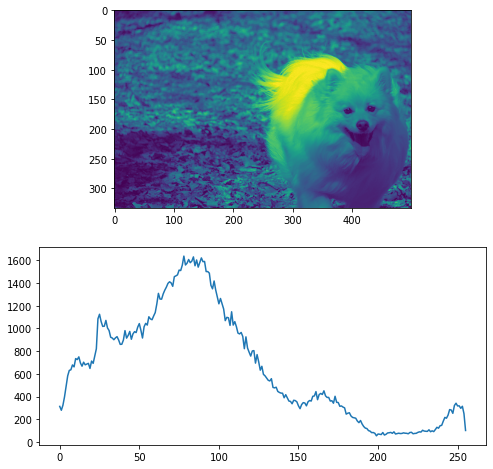

In [0]:
# importing required libraries of opencv 
import cv2 
# importing library for plotting 
from matplotlib import pyplot as plt 
def plot_image_histograms(image): 
  # reads an input image 
  img = cv2.imread(image,0) 
  # find frequency of pixels in range 0-255 
  histr = cv2.calcHist([img],[0],None,[256],[0,256]) 
    
  # show the plotting graph of an image 
  fig = plt.figure(figsize=(8, 8))
  plt.subplot(2,1,1)
  plt.imshow(img)
  plt.subplot(2,1,2)
  plt.plot(histr) 
  plt.show() 

plot_image_histograms('./Flickr8k//Flicker8k_Dataset/3439243433_d5f3508612.jpg')

## Crating VGG16 Model

In [0]:
modelvgg = VGG16(include_top=True,weights=None)

In [0]:
modelvgg.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [0]:
image_model = VGG16(include_top=False,weights='imagenet')
new_input = image_model.input # Any arbitrary shapes with 3 channels
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

58892288/58889256 [==============================] - 1s 0us/step


In [0]:
image_features_extract_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

## Extracting Features

 


In [0]:
# Get unique images
encode_train = sorted(set(img_name_vector))
print(encode_train[:10])

['Flickr8k/Flicker8k_Dataset/1000268201_693b08cb0e.jpg', 'Flickr8k/Flicker8k_Dataset/1001773457_577c3a7d70.jpg', 'Flickr8k/Flicker8k_Dataset/1002674143_1b742ab4b8.jpg', 'Flickr8k/Flicker8k_Dataset/1003163366_44323f5815.jpg', 'Flickr8k/Flicker8k_Dataset/1007129816_e794419615.jpg', 'Flickr8k/Flicker8k_Dataset/1007320043_627395c3d8.jpg', 'Flickr8k/Flicker8k_Dataset/1009434119_febe49276a.jpg', 'Flickr8k/Flicker8k_Dataset/1012212859_01547e3f17.jpg', 'Flickr8k/Flicker8k_Dataset/1015118661_980735411b.jpg', 'Flickr8k/Flicker8k_Dataset/1015584366_dfcec3c85a.jpg']


In [0]:
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
for files in image_dataset: 
    print(files.numpy())

Streaming output truncated to the last 5000 lines.
b'Flickr8k/Flicker8k_Dataset/2844846111_8c1cbfc75d.jpg'
b'Flickr8k/Flicker8k_Dataset/2844963839_ff09cdb81f.jpg'
b'Flickr8k/Flicker8k_Dataset/2845246160_d0d1bbd6f0.jpg'
b'Flickr8k/Flicker8k_Dataset/2845691057_d4ab89d889.jpg'
b'Flickr8k/Flicker8k_Dataset/2845845721_d0bc113ff7.jpg'
b'Flickr8k/Flicker8k_Dataset/2846037553_1a1de50709.jpg'
b'Flickr8k/Flicker8k_Dataset/2846785268_904c5fcf9f.jpg'
b'Flickr8k/Flicker8k_Dataset/2846843520_b0e6211478.jpg'
b'Flickr8k/Flicker8k_Dataset/2847514745_9a35493023.jpg'
b'Flickr8k/Flicker8k_Dataset/2847615962_c330bded6e.jpg'
b'Flickr8k/Flicker8k_Dataset/2847859796_4d9cb0d31f.jpg'
b'Flickr8k/Flicker8k_Dataset/2848266893_9693c66275.jpg'
b'Flickr8k/Flicker8k_Dataset/2848571082_26454cb981.jpg'
b'Flickr8k/Flicker8k_Dataset/2848895544_6d06210e9d.jpg'
b'Flickr8k/Flicker8k_Dataset/2848977044_446a31d86e.jpg'
b'Flickr8k/Flicker8k_Dataset/2849194983_2968c72832.jpg'
b'Flickr8k/Flicker8k_Dataset/2850719435_221f15e951.jp

##  Images Resizing to (224, 224, 3)

Shape after resize : (224, 224, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


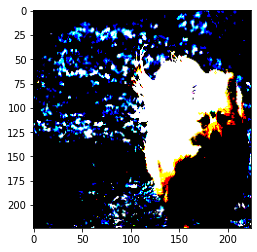

In [0]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    img = preprocess_input(img)
    return img, image_path

img1,img1_path = load_image("./Flickr8k//Flicker8k_Dataset/3439243433_d5f3508612.jpg")
print("Shape after resize :", img1.shape)
plt.imshow(img1)

## Mapping image names

In [0]:
# !python --version

In [0]:
# # Initialize the keras global outside of any tf.functions
# temp = tf.zeros([4, 32, 32, 3])  # Or tf.zeros
# tf.keras.applications.vgg16.preprocess_input(temp)

In [0]:
# Feel free to change batch_size according to your system configuration
image_dataset = image_dataset.map(load_image, 
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(64)

In [0]:
image_dataset

<BatchDataset shapes: ((None, 224, 224, 3), (None,)), types: (tf.float32, tf.string)>

In [0]:
from tqdm import tqdm

In [0]:
for img, path in tqdm(image_dataset):
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,(batch_features.shape[0], -1, batch_features.shape[3]))
  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

127it [02:11,  1.04s/it]


In [0]:
np_img =np.load('./Flickr8k//Flicker8k_Dataset/3338291921_fe7ae0c8f8.jpg.npy')

In [0]:
print(np_img)
print("Shape : {}".format(np_img.shape))

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 ...
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        3.9950836 0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]
Shape : (49, 512)


## Tokenizing the captions and creating vocabulary

In [0]:
def tokenize_caption(top_k,train_captions):
  # Choose the top 5000 words from the vocabulary
  tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,oov_token="<unk>",filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
  # oov_token: if given, it will be added to word_index and used to replace out-of-vocabulary words during text_to_sequence calls
  
  tokenizer.fit_on_texts(train_captions)
  train_seqs = tokenizer.texts_to_sequences(train_captions)

  # Map '<pad>' to '0'
  tokenizer.word_index['<pad>'] = 0
  tokenizer.index_word[0] = '<pad>'


  # Create the tokenized vectors
  train_seqs = tokenizer.texts_to_sequences(train_captions)
  return train_seqs, tokenizer

train_seqs , tokenizer = tokenize_caption(5000,train_captions)

In [0]:
train_captions[:3]

['<start>  several children leaping into pile of leaves on the ground <end>',
 '<start>  man hiking in the wilderness giving the camera thumbs up <end>',
 '<start>  white dog is running through the water onto the shore <end>']

In [0]:
train_seqs[:3] # Here we can see that the sentences are converted to sequences

[[2, 184, 62, 331, 64, 524, 12, 329, 6, 5, 167, 3],
 [2, 11, 588, 4, 5, 2384, 895, 5, 93, 1281, 53, 3],
 [2, 14, 9, 7, 32, 33, 5, 24, 238, 5, 280, 3]]

- Here we can see that the size of each caption vectors are different.
- So, we need to pad the vector upto max_length of the caption

In [0]:
# oov_token: if given, it will be added to word_index and used to replace out-of-vocabulary words during text_to_sequence calls
tokenizer.oov_token

'<unk>'

In [0]:
tokenizer.index_word

{1: '<unk>',
 2: '<start>',
 3: '<end>',
 4: 'in',
 5: 'the',
 6: 'on',
 7: 'is',
 8: 'and',
 9: 'dog',
 10: 'with',
 11: 'man',
 12: 'of',
 13: 'two',
 14: 'white',
 15: 'black',
 16: 'boy',
 17: 'are',
 18: 'woman',
 19: 'girl',
 20: 'to',
 21: 'wearing',
 22: 'at',
 23: 'people',
 24: 'water',
 25: 'red',
 26: 'young',
 27: 'brown',
 28: 'an',
 29: 'his',
 30: 'blue',
 31: 'dogs',
 32: 'running',
 33: 'through',
 34: 'playing',
 35: 'while',
 36: 'down',
 37: 'shirt',
 38: 'standing',
 39: 'ball',
 40: 'little',
 41: 'grass',
 42: 'child',
 43: 'person',
 44: 'snow',
 45: 'jumping',
 46: 'over',
 47: 'front',
 48: 'three',
 49: 'sitting',
 50: 'holding',
 51: 'field',
 52: 'small',
 53: 'up',
 54: 'by',
 55: 'large',
 56: 'green',
 57: 'one',
 58: 'group',
 59: 'yellow',
 60: 'her',
 61: 'walking',
 62: 'children',
 63: 'men',
 64: 'into',
 65: 'air',
 66: 'beach',
 67: 'near',
 68: 'mouth',
 69: 'jumps',
 70: 'another',
 71: 'for',
 72: 'street',
 73: 'its',
 74: 'runs',
 75: 'from

In [0]:
tokenizer.word_counts

OrderedDict([('<start>', 40000),
             ('several', 308),
             ('children', 1136),
             ('leaping', 138),
             ('into', 1067),
             ('pile', 74),
             ('of', 6632),
             ('leaves', 139),
             ('on', 10622),
             ('the', 18232),
             ('ground', 355),
             ('<end>', 40000),
             ('man', 7193),
             ('hiking', 63),
             ('in', 18771),
             ('wilderness', 6),
             ('giving', 34),
             ('camera', 685),
             ('thumbs', 19),
             ('up', 1244),
             ('white', 3896),
             ('dog', 8046),
             ('is', 9266),
             ('running', 2049),
             ('through', 2012),
             ('water', 2757),
             ('onto', 211),
             ('shore', 169),
             ('young', 2598),
             ('relaxing', 15),
             ('his', 2327),
             ('legs', 130),
             ('pice', 1),
             ('machinery', 1),

### MaxLength and MinLength of any captions

In [0]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

In [0]:
# Find the maximum length of any caption in our dataset
def calc_min_length(tensor):
    return min(len(t) for t in tensor)
# Calculates the max_length, which is used to store the attention weights
min_length = calc_min_length(train_seqs)

In [0]:
print('Max Length of any caption : Min Length of any caption = '+ str(max_length) +" : "+str(min_length))

Max Length of any caption : Min Length of any caption = 33 : 2


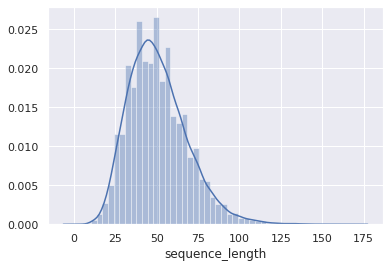

In [0]:
import seaborn as sns

df=pd.DataFrame()
df["sequence_length"] = data["caption"].apply(len)

sns.set()
distribution = sns.distplot(df["sequence_length"])

## Padding each vector to the captions' max_length 

In [0]:
def padding_train_sequences(train_seqs,max_length,padding_type):
  cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding=padding_type,maxlen=max_length)
  return cap_vector

In [0]:
padded_caption_vector = padding_train_sequences(train_seqs,max_length,'post')
print(padded_caption_vector.shape)

(40000, 33)


In [0]:
padded_caption_vector

array([[  2, 184,  62, ...,   0,   0,   0],
       [  2,  11, 588, ...,   0,   0,   0],
       [  2,  14,   9, ...,   0,   0,   0],
       ...,
       [  2,  19,   4, ...,   0,   0,   0],
       [  2,  16,   4, ...,   0,   0,   0],
       [  2, 153,   9, ...,   0,   0,   0]], dtype=int32)

## Splitting Train-Test 

In [0]:
# Create training and test set using an 80-20 split
img_name_train, img_name_test, caption_train, caption_test = train_test_split(img_name_vector,padded_caption_vector,test_size=0.2,random_state=0)

In [0]:
print("Training Data : X = {0},Y = {1}".format(len(img_name_train), len(caption_train)))
print("Test Data : X = {0},Y = {1}".format(len(img_name_test), len(caption_test)))

Training Data : X = 32000,Y = 32000
Test Data : X = 8000,Y = 8000


## Creating dataset

### Loading the .npy files

In [0]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000

In [0]:
def load_npy(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [0]:
'''
# How Dataset.from_tensor_slices work
t = tf.constant([[1, 2], [3, 4]])
ds = tf.data.Dataset.from_tensor_slices(t)   # [1, 2], [3, 4]
ds # <TensorSliceDataset shapes: (2,), types: tf.int32>
'''
def create_dataset(img_name_train,caption_train):

  
  dataset = tf.data.Dataset.from_tensor_slices((img_name_train, caption_train))

  # Use map to load the numpy files in parallel
  dataset = dataset.map(lambda item1, item2: tf.numpy_function(load_npy, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)

  # Shuffle and batch
  dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset


In [0]:
# Creating train and test dataset
dataset = create_dataset(img_name_train,caption_train)
test_dataset = create_dataset(img_name_test,caption_test)

In [0]:
embedding_dim = 256
units = 512
vocab_size = len(tokenizer.word_index) + 1 #8329
num_steps = len(img_name_train) // BATCH_SIZE  #500
EPOCHS = 20
# Shape from last layer of VGG-16 :(7,7,512)
# So, say there are 49 pixel locations now and each pixel is 512 dimensional
features_shape = 512
attention_features_shape = 49 

### CNN ENCODER:
- Now, let's define the CNN ENCODER, that will be the single fully connected layer followed by ReLU activation.

In [0]:
# https://www.tensorflow.org/tutorials/text/image_captioning
class VGG16_Encoder(tf.keras.Model):
    # This encoder passes the features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(VGG16_Encoder, self).__init__()
        # shape after fc == (batch_size, 49, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)
        self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)

    def call(self, x):
        #x= self.dropout(x)
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x        

In [0]:
def rnn_type(units):
  # If you have a GPU, we recommend using CuDNNGRU(provides a 3x speedup than GRU)
  # the code automatically does that.
    if tf.test.is_gpu_available():
        return tf.compat.v1.keras.layers.CuDNNLSTM(units, 
                                        return_sequences=True, 
                                        return_state=True, 
                                        recurrent_initializer='glorot_uniform')
    else:
        return tf.keras.layers.GRU(units, 
                                   return_sequences=True, 
                                   return_state=True, 
                                   recurrent_activation='sigmoid', 
                                   recurrent_initializer='glorot_uniform')

# Local Attention or Global Attention for the Decoder

In [0]:

class Rnn_Local_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(Rnn_Local_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    
    self.fc1 = tf.keras.layers.Dense(self.units)

    self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)
    self.batchnormalization = tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

    self.fc2 = tf.keras.layers.Dense(vocab_size)

    # Implementing Attention Mechanism 
    self.Uattn = tf.keras.layers.Dense(units)
    self.Wattn = tf.keras.layers.Dense(units)
    self.Vattn = tf.keras.layers.Dense(1)
    


  def call(self, x, features, hidden):
    
    # features shape ==> (64,49,256) ==> Output from ENCODER
    
    # hidden shape == (batch_size, hidden_size) ==>(64,512)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size) ==> (64,1,512)
    
    hidden_with_time_axis = tf.expand_dims(hidden, 1)
    
    # score shape == (64, 49, 1)
    # Attention Function
    '''e(ij) = f(s(t-1),h(j))'''
    ''' e(ij) = Vattn(T)*tanh(Uattn * h(j) + Wattn * s(t))'''
    score = self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)))
    # self.Uattn(features) : (64,49,512)
    # self.Wattn(hidden_with_time_axis) : (64,1,512)
    # tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)) : (64,49,512)
    # self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis))) : (64,49,1) ==> score
    # you get 1 at the last axis because you are applying score to self.Vattn
    
    
    # Then find Probability using Softmax
    '''attention_weights(alpha(ij)) = softmax(e(ij))'''
    attention_weights = tf.nn.softmax(score, axis=1)
    # attention_weights shape == (64, 49, 1)

    
    # Give weights to the different pixels in the image
    ''' C(t) = Summation(j=1 to T) (attention_weights * VGG-16 features) ''' 
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)
    # Context Vector(64,256) = AttentionWeights(64,49,1) * features(64,49,256)
    # context_vector shape after sum == (64, 256)
    
    
    # x shape after passing through embedding == (64, 1, 256)
    x = self.embedding(x)
    
    # x shape after concatenation == (64, 1,  512)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # Adding Dropout and BatchNorm Layers
    x= self.dropout(x)
    x= self.batchnormalization(x)
    # output shape == (64 * 512)
    x = self.fc2(x)
    # shape : (64 * 8329(vocab))
    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

## RNN DECODER AND LUONG ATTENTION(GLOBAL ATTENTION)

In [0]:
''' To choose score type: 
  Enter 'dot' for dot score
  Enter 'general' for general score
  Enter 'concat' for concat score
'''
def score_choose():
  # scoring_type= input('Enter the scoring method: ')
  scoring_type= 'general'
  return scoring_type

In [0]:
scoring_type=score_choose()

In [0]:
class Rnn_Global_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size,scoring_type):
        super(Rnn_Global_Decoder, self).__init__()
        

        self.units = units
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        
        
        
        self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
        
        self.wc = tf.keras.layers.Dense(units, activation='tanh')
        self.ws = tf.keras.layers.Dense(vocab_size)

        #For Attention
        self.wa = tf.keras.layers.Dense(units)
        self.wb = tf.keras.layers.Dense(units)
        
        #For Score 3 i.e. Concat score
        self.Vattn = tf.keras.layers.Dense(1)
        self.wd = tf.keras.layers.Dense(units, activation='tanh')

        self.scoring_type = scoring_type

        
    def call(self, sequence, features,hidden):
        
        # features : (64,49,256)
        # hidden : (64,512)
        
        embed = self.embedding(sequence)
        # embed ==> (64,1,256) ==> decoder_input after embedding (embedding dim=256)
       
        output, state = self.gru(embed)       
        #output :(64,1,512)

        score=0
        
        #Dot Score as per paper(Dot score : h_t (dot) h_s') (NB:just need to tweak gru units to 256)
        '''----------------------------------------------------------'''
        if(self.scoring_type=='dot'):
          xt=output #(64,1,512)
          xs=features #(256,49,64)  
          score = tf.matmul(xt, xs, transpose_b=True) 
               
          #score : (64,1,49)

        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''



        # General Score as per Paper ( General score: h_t (dot) Wa (dot) h_s')
        '''----------------------------------------------------------'''
        if(self.scoring_type=='general'):
          score = tf.matmul(output, self.wa(features), transpose_b=True)
          # score :(64,1,49)
        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''




        # Concat score as per paper (score: VT*tanh(W[ht;hs']))    
        '''----------------------------------------------------------'''
        #https://www.tensorflow.org/api_docs/python/tf/tile
        if(self.scoring_type=='concat'):
          tiled_features = tf.tile(features, [1,1,2]) #(64,49,512)
          tiled_output = tf.tile(output, [1,49,1]) #(64,49,512)
          
          concating_ht_hs = tf.concat([tiled_features,tiled_output],2) ##(64,49,1024)
          
          tanh_activated = self.wd(concating_ht_hs)
          score =self.Vattn(tanh_activated)
          #score :(64,49,1), but we want (64,1,49)
          score= tf.squeeze(score, 2)
          #score :(64,49)
          score = tf.expand_dims(score, 1)
          
          #score :(64,1,49)
        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''



        # alignment vector a_t
        alignment = tf.nn.softmax(score, axis=2)
        # alignment :(64,1,49)

        # context vector c_t is the average sum of encoder output
        context = tf.matmul(alignment, features)
        # context : (64,1,256)
        
        # Combine the context vector and the LSTM output
        
        output = tf.concat([tf.squeeze(context, 1), tf.squeeze(output, 1)], 1)
        # output: concat[(64,1,256):(64,1,512)] = (64,768)

        output = self.wc(output)
        # output :(64,512)

        # Finally, it is converted back to vocabulary space: (batch_size, vocab_size)
        logits = self.ws(output)
        # logits/predictions: (64,8239) i.e. (batch_size,vocab_size))

        return logits, state, alignment

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [0]:
''' Type: 'global' for Luong's Attention Mechanism(Global Attention) 
    Type: 'local' for Bahdanau's Attention Mechanism(Local Attention) 
'''
# attention_choice = input("Choose the type of Attention Mechanism you want to apply :")

attention_choice = 'global'

In [0]:
if(attention_choice=='local'):
    encoder = VGG16_Encoder(embedding_dim)
    decoder = Rnn_Local_Decoder(embedding_dim, units, vocab_size)

else:
    encoder = VGG16_Encoder(embedding_dim)
    decoder = Rnn_Global_Decoder(embedding_dim, units, vocab_size,scoring_type)


In [0]:
decoder

In [0]:
# def Encoder_features(img_tensor, target):
#   features = encoder(img_tensor)
#   return features,target,img_tensor

# for (batch, (img_tensor, target)) in enumerate(dataset):
#   features,target,img_tensor= Encoder_features(img_tensor, target)


In [0]:
# target.shape # (batch_size,max_length)

In [0]:
# img_tensor.shape #(batch_size,attention_feature_shape,feature_shape)

In [0]:
# features.shape #(batch_size,attention_feature_shape,feature_shape)

In [0]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

## Checkpoint Saving 

In [0]:
checkpoint_path_ckpt = "./checkpoint_finally19/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path_ckpt, max_to_keep=5)

- Start checkpointing from the checkpoint last saved

In [0]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

## Tensorboard Setup

In [0]:
# Clear previous logs
!rm -rf ./logs/ 

In [0]:

# Define our metrics
train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
# train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')

In [0]:
import datetime
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
test_log_dir = 'logs/gradient_tape/' + current_time + '/test'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

In [0]:
loss_plot = []

@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * BATCH_SIZE, 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          #dec_input = tf.expand_dims(target[:, i], 1)
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
          

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  #train_loss(loss)
  #train_accuracy(target, predictions)

  return loss, total_loss

In [0]:
test_loss_plot = []

@tf.function
def test_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * BATCH_SIZE, 1)

  features = encoder(img_tensor)

  for i in range(1, target.shape[1]):
      # passing the features through the decoder

      
      predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
      # predictions : (64,8329)
      loss += loss_function(target[:, i], predictions)
      
      predicted_id = tf.argmax(predictions[0])
      dec_input = tf.expand_dims([predicted_id]*BATCH_SIZE, 1)
 

  total_loss = (loss / int(target.shape[1]))

  return loss, total_loss

## Training

In [0]:
for epoch in range(start_epoch, 20):
    start = time.time()

    #For Train
    #================================================================
    total_loss_train = 0
    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss_train += t_loss
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss_train / num_steps)

    # Tensorboard 
    with train_summary_writer.as_default():
      tf.summary.scalar('LossPlotTrain', (total_loss_train/ num_steps), step=epoch)
      tf.summary.scalar('Train_loss', train_loss.result(), step=epoch)

    #For Test
    #================================================================
    total_loss_test = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss_test += t_loss
    # storing the epoch end loss value to plot later
    test_loss_plot.append(total_loss_test / num_steps) 

    # Tensorboard 
    with test_summary_writer.as_default():
      tf.summary.scalar('LossPlotTest', (total_loss_test/ num_steps), step=epoch)

    
    if epoch % 5 == 0:
      ckpt_manager.save()

    print ('Epoch {} TrainLoss {:.6f} TestLoss {:.6f}'.format(epoch + 1,(total_loss_train/num_steps),(total_loss_test/num_steps)))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

Epoch 1 TrainLoss 1.607539 TestLoss 0.458554
Time taken for 1 epoch 126.77819323539734 sec

Epoch 2 TrainLoss 1.405468 TestLoss 0.499907
Time taken for 1 epoch 95.58435344696045 sec

Epoch 3 TrainLoss 1.307525 TestLoss 0.514737
Time taken for 1 epoch 94.84442591667175 sec

Epoch 4 TrainLoss 1.270033 TestLoss 0.512402
Time taken for 1 epoch 94.80027389526367 sec

Epoch 5 TrainLoss 1.241341 TestLoss 0.517693
Time taken for 1 epoch 95.04060125350952 sec

Epoch 6 TrainLoss 1.221944 TestLoss 0.525910
Time taken for 1 epoch 95.53870296478271 sec

Epoch 7 TrainLoss 1.214167 TestLoss 0.525249
Time taken for 1 epoch 94.70566248893738 sec

Epoch 8 TrainLoss 1.191599 TestLoss 0.522742
Time taken for 1 epoch 96.09206080436707 sec

Epoch 9 TrainLoss 1.178908 TestLoss 0.522654
Time taken for 1 epoch 93.7289764881134 sec

Epoch 10 TrainLoss 1.161890 TestLoss 0.531973
Time taken for 1 epoch 93.87629699707031 sec

Epoch 11 TrainLoss 1.148723 TestLoss 0.539658
Time taken for 1 epoch 93.85910439491272 se

## Tensorboard running

In [0]:
%load_ext tensorboard
%tensorboard --logdir logs/gradient_tape

In [0]:
ckpt_manager.checkpoints

['./checkpoint_finally19/train/ckpt-1',
 './checkpoint_finally19/train/ckpt-2',
 './checkpoint_finally19/train/ckpt-3',
 './checkpoint_finally19/train/ckpt-4']

In [0]:
ckpt.restore('./checkpoint_finally19/train/ckpt-4')

No handles with labels found to put in legend.


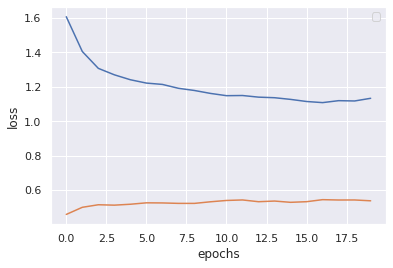

In [0]:
for label in [loss_plot,test_loss_plot]:
    plt.plot(label)
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()


## Evaluate the captions
1. Greedy Approach
2. Beam Search


## Greedy Approach

In [0]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0) # Start token is <start> for LSTM
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        result.append(tokenizer.index_word[predicted_id]) # Store the result or word predicted

        if tokenizer.index_word[predicted_id] == '<end>': # if you reach <end> token then return the result
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0) # Decoder input is the word predicted at previous timestep

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

## Beam Search

In [0]:
def evaluate(image, beam_index = 3):

    start = [tokenizer.word_index['<start>']]
    
    # result[0][0] = index of the starting word
    # result[0][1] = probability of the word predicted
    result = [[start, 0.0]]

    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)

    while len(result[0][0]) < max_length:
        i=0
        temp = []
        for s in result:

          predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

          attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
          i=i+1
          # Getting the top <beam_index>(n) predictions
          word_preds = np.argsort(predictions[0])[-beam_index:]
          
          # creating a new list so as to put them via the model again
          for w in word_preds:       
            next_cap, prob = s[0][:], s[1]
            next_cap.append(w)
            prob += predictions[0][w]
            temp.append([next_cap, prob])
        result = temp
        # Sorting according to the probabilities
        result = sorted(result, reverse=False, key=lambda l: l[1])
        # Getting the top words
        result = result[-beam_index:]
        
        predicted_id = result[-1] # with Max Probability
        pred_list = predicted_id[0]
        
        prd_id = pred_list[-1] 
        if(prd_id!=3):
          dec_input = tf.expand_dims([prd_id], 0)  # Decoder input is the word predicted with highest probability among the top_k words predicted
        else:
          break

    result = result[-1][0]
    
    intermediate_caption = [tokenizer.index_word[i] for i in result]
    final_caption = []
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
            
        else:
            break

    attention_plot = attention_plot[:len(result), :]
    final_caption = ' '.join(final_caption[1:])
    return final_caption,attention_plot



In [0]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))
    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

Flickr8k/Flicker8k_Dataset/2742426734_291df6da08.jpg
BELU score: 7.813586220751259
Real Caption: group of people posing for picture on the grass
Prediction Caption: man in the
time took to Predict: 0 sec


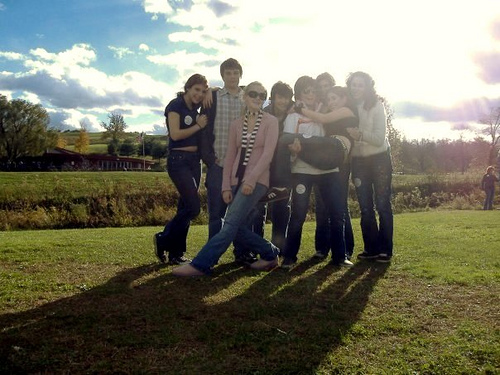

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ''.join(str(result))
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()


score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result_final, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

### Greedy Search

In [0]:
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
print(real_caption)

<start> group of people posing for picture on the grass <end>


Flickr8k/Flicker8k_Dataset/3242007318_01e82171aa.jpg
BELU score: 0
Real Caption: two women standing in front of large brick building
Prediction Caption: t w o   m e n   i n   t h e   b a c k g r o u n
time took to Predict: 0 sec


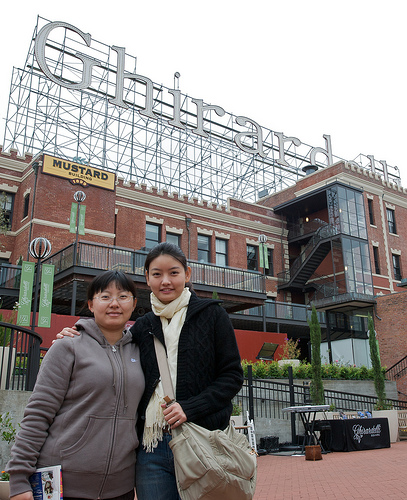

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

### Beam Search(b=3)

Flickr8k/Flicker8k_Dataset/413231421_43833a11f5.jpg
BELU score: 0
Real Caption: black dog is digging in the snow
Prediction Caption(Beam=3): t w o   d o g s   a r e   p l a y i n g   i n   t h e   s n o
time took to Predict: 0 sec


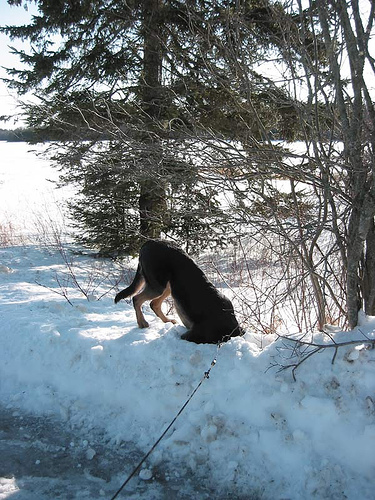

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/413231421_43833a11f5.jpg'
print(image)
start = time.time()
real_caption = '<start> black dog is digging in the snow <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=3):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/413231421_43833a11f5.jpg')

In [0]:
score = sentence_bleu('black dog is digging in the snow', 'dog is digging in the snow', weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

BELU score: 65.04436355879909


## Beam Search(b=7)

Flickr8k/Flicker8k_Dataset/413231421_43833a11f5.jpg
BELU score: 0
Prediction Caption(Beam=7): t w o   d o g s   a r e   p l a y i n g   i n   t h e   s n o
time took to Predict: 0 sec


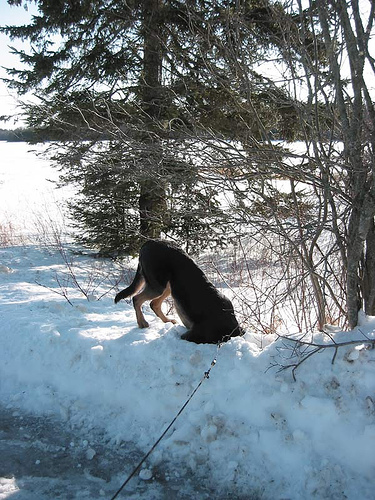

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/413231421_43833a11f5.jpg'
print(image)
start = time.time()
real_caption = '<start> black dog is digging in the snow <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=7):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/413231421_43833a11f5.jpg')

In [0]:
score = sentence_bleu('black dog is digging in the snow', 'the dog is digging in snow', weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

BELU score: 65.04436355879909


## Beam Search(b=10)

Flickr8k/Flicker8k_Dataset/413231421_43833a11f5.jpg
BELU score: 0
Prediction Caption(Beam=10): t w o   d o g s   a r e   p l a y i n g   i n   t h e   s n o
time took to Predict: 0 sec


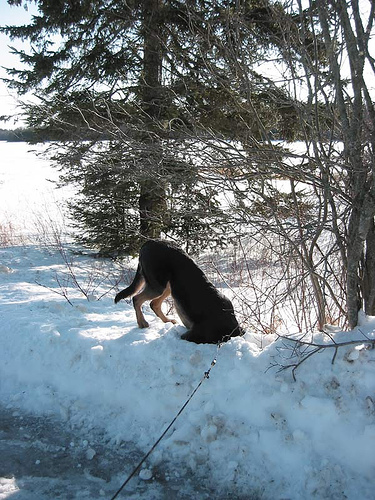

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/413231421_43833a11f5.jpg'
print(image)
start = time.time()
real_caption = '<start> black dog is digging in the snow <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=10):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/413231421_43833a11f5.jpg')

### Greedy Search

Flickr8k/Flicker8k_Dataset/3512791890_eb065b460a.jpg
BELU score: 0
Real Caption: young girl and woman smile for the camera
Prediction Caption: w o m a n   i n   t h e   b e a c
time took to Predict: 0 sec


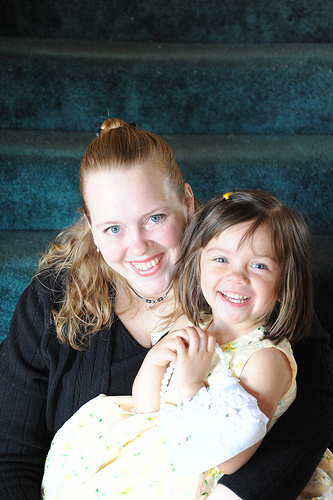

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

## Beam Search(b=3)

Flickr8k/Flicker8k_Dataset/3014015906_fdba461f36.jpg
BELU score: 29.488391230979428
Real Caption: three people walking along a stream in a jungle
Prediction Caption(Beam=3): m a n   i s   j u m p i n g   i n t o   t h e   b e a c
time took to Predict: 0 sec


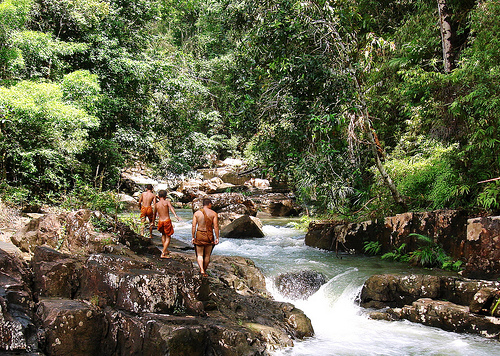

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/3014015906_fdba461f36.jpg'
print(image)
start = time.time()
real_caption = '<start> three people walking along a stream in a jungle <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=3):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/3014015906_fdba461f36.jpg')

## Beam Search(b=7)

Flickr8k/Flicker8k_Dataset/3014015906_fdba461f36.jpg
BELU score: 29.488391230979428
Real Caption: three people walking along a stream in a jungle
Prediction Caption(Beam=7): m a n   i s   j u m p i n g   i n t o   t h e   b e a c
time took to Predict: 0 sec


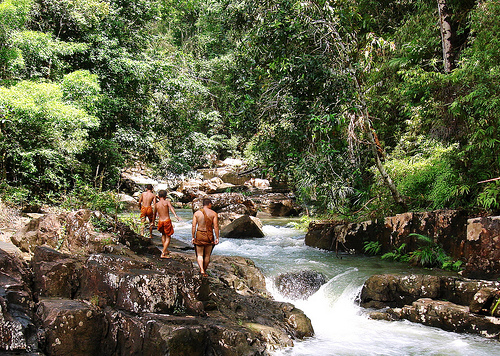

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/3014015906_fdba461f36.jpg'
print(image)
start = time.time()
real_caption = '<start> three people walking along a stream in a jungle <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=7):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/3014015906_fdba461f36.jpg')

## Beam Search(b=10)

Flickr8k/Flicker8k_Dataset/3014015906_fdba461f36.jpg
BELU score: 29.488391230979428
Real Caption: three people walking along a stream in a jungle
Prediction Caption(Beam=10): m a n   i s   j u m p i n g   i n t o   t h e   b e a c
time took to Predict: 0 sec


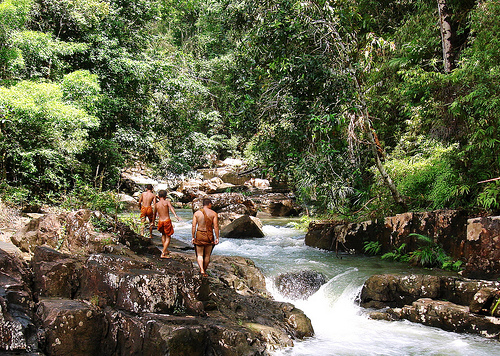

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/3014015906_fdba461f36.jpg'
print(image)
start = time.time()
real_caption = '<start> three people walking along a stream in a jungle <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=10):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/3014015906_fdba461f36.jpg')

## Try captions on Validation Set

### Greedy Search

Flickr8k/Flicker8k_Dataset/3019923691_3b3c5a4766.jpg
BELU score: 0
Real Caption: the black dog wearing red collar shakes water off
Prediction Caption: d o g   i s   r u n n i n g   t h r o u g h   t h e   w a t e
time took to Predict: 0 sec


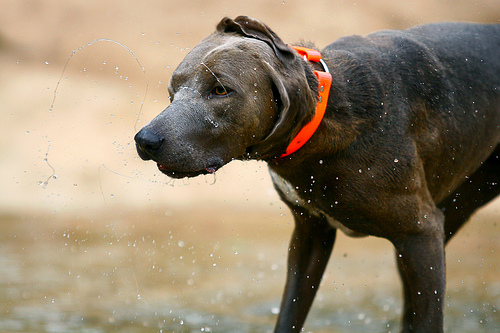

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

### Beam Search(b=3)

Flickr8k/Flicker8k_Dataset/1240297429_c36ae0c58f.jpg
BELU score: 0
Real Caption: woman holding video camera
Prediction Caption(Beam=3): m a n   i s   j u m p i n g   t h r o u g h   t h e   g r a s
time took to Predict: 0 sec


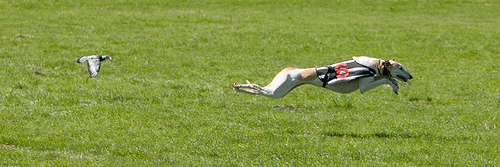

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/1240297429_c36ae0c58f.jpg'
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=3):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/1240297429_c36ae0c58f.jpg')

In [0]:
score = sentence_bleu('white and tan dog leaps through the air', 'dog is leaping through the grass', weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

BELU score: 68.46531968814577


## Beam Search(b=7)

Flickr8k/Flicker8k_Dataset/1240297429_c36ae0c58f.jpg
BELU score: 0
Prediction Caption(Beam=7): m a n   i s   j u m p i n g   t h r o u g h   t h e   g r a s
time took to Predict: 0 sec


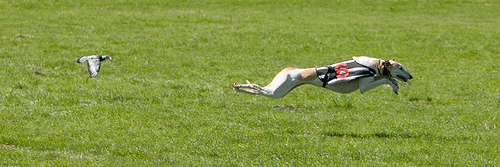

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/1240297429_c36ae0c58f.jpg'
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=7):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/1240297429_c36ae0c58f.jpg')

In [0]:
score = sentence_bleu('white and tan dog leaps through the air', 'dog is leaping through field', weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

BELU score: 73.19250547114


## Beam Search(b=10)

Flickr8k/Flicker8k_Dataset/1240297429_c36ae0c58f.jpg
BELU score: 0
Prediction Caption(Beam=10): m a n   i s   j u m p i n g   t h r o u g h   t h e   g r a s
time took to Predict: 0 sec


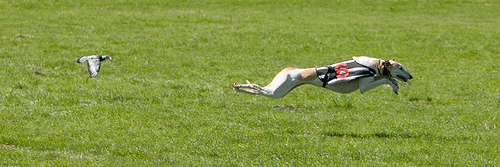

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/1240297429_c36ae0c58f.jpg'
print(image)
start = time.time()
real_caption = '<start> white and tan dog leaps through the air <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=10):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/1240297429_c36ae0c58f.jpg')

### Greedy Search

Flickr8k/Flicker8k_Dataset/3682277595_55f8b16975.jpg
BELU score: 0
Real Caption: greyhound walks in the rain through large puddle
Prediction Caption: b r o w n   d o g   i s   r u n n i n g   t h r o u g h   t h e   w a t e
time took to Predict: 0 sec


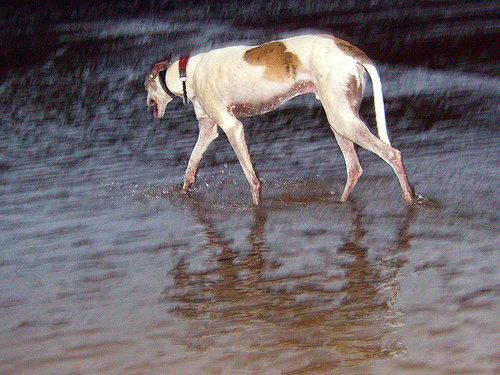

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

## Beam Search(b=3)

Flickr8k/Flicker8k_Dataset/270809922_043e3bef06.jpg
BELU score: 0
Real Caption: two dogs fighting one is black the other beige
Prediction Caption(Beam=3): m a n   i n   s n o
time took to Predict: 0 sec


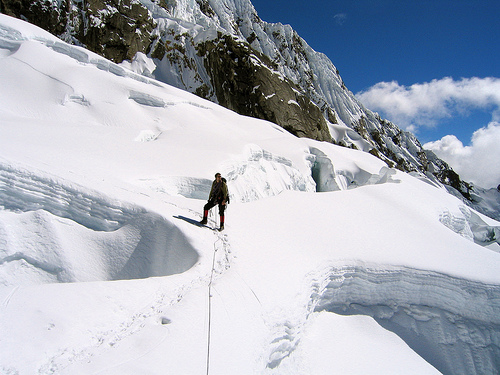

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/270809922_043e3bef06.jpg'
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=3):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/270809922_043e3bef06.jpg')

In [0]:
score = sentence_bleu('lone man climbing high on snowy mountain', 'man is standing on top of glacier', weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

BELU score: 60.30226891555272


## Beam Search(b=7)

Flickr8k/Flicker8k_Dataset/270809922_043e3bef06.jpg
BELU score: 0
Prediction Caption(Beam=7): m a n   i n   s n o
time took to Predict: 0 sec


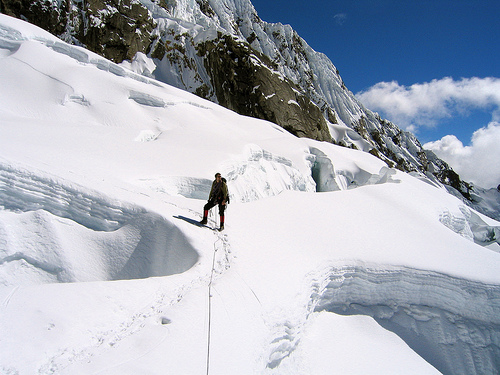

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/270809922_043e3bef06.jpg'
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=7):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/270809922_043e3bef06.jpg')

In [0]:
score = sentence_bleu('lone man climbing high on snowy mountain', 'man is standing in the snow', weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

BELU score: 66.66666666666666


## Beam Search(b=10)

Flickr8k/Flicker8k_Dataset/270809922_043e3bef06.jpg
BELU score: 0
Prediction Caption(Beam=10): m a n   i n   s n o
time took to Predict: 0 sec


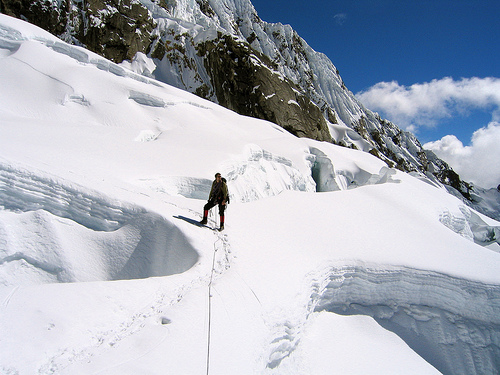

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/270809922_043e3bef06.jpg'
print(image)
start = time.time()
real_caption = '<start> lone man climbing high on snowy mountain <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=10):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/270809922_043e3bef06.jpg')

### Greedy Search

Flickr8k/Flicker8k_Dataset/2109911919_af45b93ef3.jpg
BELU score: 0
Real Caption: person climbing up snowy mountain
Prediction Caption: m a n   i s   j u m p i n g   d o w n   s n o
time took to Predict: 0 sec


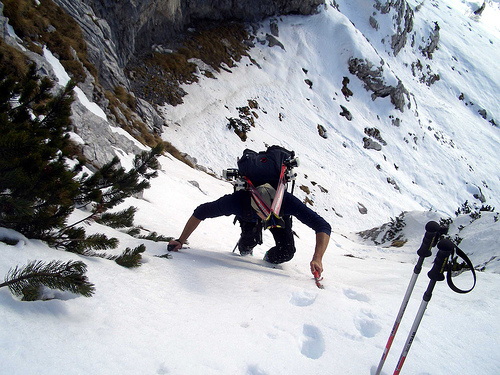

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

## Beam Search(b=3)

Flickr8k/Flicker8k_Dataset/69189650_6687da7280.jpg
BELU score: 0
Real Caption: man on narrow dock plays with his dog that is jumping out of the water
Prediction Caption(Beam=3): d o g   r u n n i n g   t h r o u g h   t h e   g r a s
time took to Predict: 0 sec


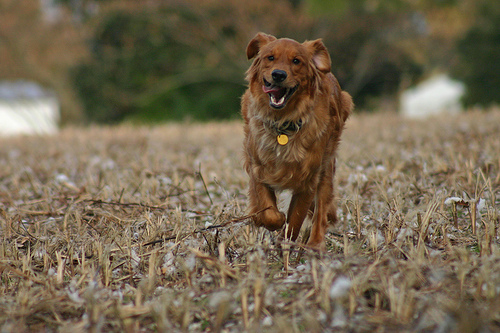

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/69189650_6687da7280.jpg'
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=3):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/69189650_6687da7280.jpg')

In [0]:
score = sentence_bleu('brown dog with his tongue <unk> as he runs through field', 'brown dog is running through the grass', weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

BELU score: 62.82808624375432


## Beam Search(b=7)

Flickr8k/Flicker8k_Dataset/69189650_6687da7280.jpg
BELU score: 0
Prediction Caption(Beam=7): d o g   r u n n i n g   t h r o u g h   t h e   g r a s
time took to Predict: 0 sec


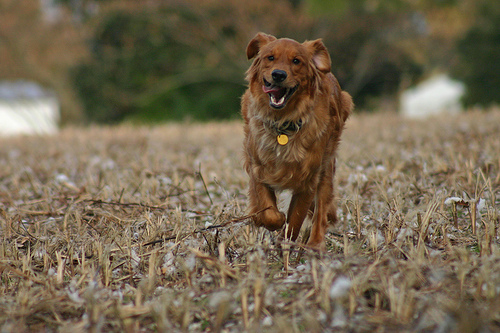

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/69189650_6687da7280.jpg'
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=7):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/69189650_6687da7280.jpg')

In [0]:
score = sentence_bleu('brown dog with his tongue <unk> as he runs through field', 'brown dog is running through the grass with his tongue out of grass with an orange toy in the dead leaves', weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

BELU score: 40.23739080814782


## Beam Search(b=10)

Flickr8k/Flicker8k_Dataset/69189650_6687da7280.jpg
BELU score: 0
Prediction Caption(Beam=10): d o g   r u n n i n g   t h r o u g h   t h e   g r a s
time took to Predict: 0 sec


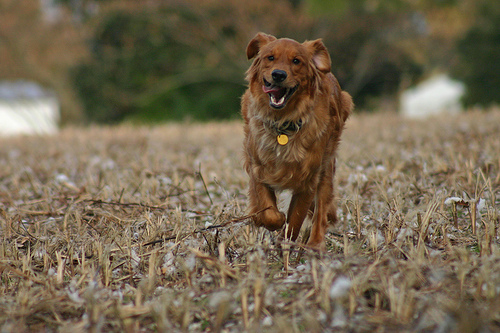

In [0]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'Flickr8k/Flicker8k_Dataset/69189650_6687da7280.jpg'
print(image)
start = time.time()
real_caption = '<start> brown dog with his tongue <unk> as he runs through field <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=10):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flickr8k/Flicker8k_Dataset/69189650_6687da7280.jpg')

# Launching Tensorboard

In [0]:
!tensorboard dev upload --logdir logs/ --name "Deep Learning Project" --description "Team: Poornapragna Vadiraj, Varun Bhaseen, Mirsaeid Abolghasemi"

2020-05-19 03:55:38.266896: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1

***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

logs

This TensorBoard will be visible to everyone. Do not upload sensitive
data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) yes

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=373649185512-8v619h5kft38l4456nm2dj4ubeqsrvh6.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scop

# View your TensorBoard live at:
https://tensorboard.dev/experiment/r7g8gQT5T2SkEXOs4gXYTQ/#scalars&_smoothingWeight=0
